 <h1 style="text-align:center;">Rain in Australia</h1>
 
- Nama : Muhammad Rinande Ansutia

- ID : PYTN-KS019-021

Dalam project ini menggunakan beberapa model machine learning untuk melakukan prediksi. Model utama adalah 
- **Logistic Regression**
- **Super Vector Machine (SVM)**

Dan beberapa model pelengkap lainnya.


Database ini memiliki 23 atribut. Dengan data hujan harian selama 10 tahun di Australia.

- Target Prediksi :
kolom RainTomorrow adalah target variable yang mau kita prediksi. Jika “Yes” maka
besok harinya disana hujan 1mm atau lebih.
Attribute Information:
1. Date - tanggal hari itu
2. Location - lokasi, nama kota di Australia
3. MinTemp - temperatur terendah hari itu dalam celcius
4. MaxTemp - temperatur tertinggi hari itu dalam celcius
5. Rainfall - jumlah curah hujan hari itu dalam mm
6. Evaporation - jumlah evaporasi dalam mm dari Class A pan selama 24 jam
sebelum jam 9 pagi hari itu
7. Sunshine - jumlah jam hari itu cerah dengan cahaya matahari
8. WindGustDir - arah kecepatan angin yang paling tinggi selama 24 jam sebelum
jam 12 malam hari itu
9. WindGustSpeed - kecepatan angin yang paling tinggi dalam km/jam selama 24
jam sebelum jam 12 malam hari itu
10. WindDir9am - arah angin jam 9 pagi
11. WindDir3pm - arah angin jam 3 sore
12. WindSpeed9am - kecepatan angin jam 9 pagi dalam km/jam dihitung dari
rata-rata kecepatan angin 10 menit sebelum jam 3 sore
13. WindSpeed3pm - kecepatan angin jam 3 sore dalam km/jam dihitung dari
rata-rata kecepatan angin 10 menit sebelum jam 3 sore
14. Humidity9am - humiditas jam 9 pagi dalam persen
15. Humidity3pm - humiditas jam 3 sore dalam persen
16. Pressure9am - tekanan udara jam 9 pagi dalam hpa
17. Pressure3pm - tekanan udara jam 3 sore dalam hpa
18. Cloud9am - persentase langit yang tertutup awan jam 9 pagi. dihitung dalam
oktas, unit ⅛, menghitung berapa unit ⅛ dari langit yang tertutup awan. Jika 0,
langit cerah, jika 8, langit sepenuhnya tertutup awan.
19. Cloud3pm - persentase langit yang tertutup awan jam 3 sore
20. Temp9am - temperatur jam 9 pagi dalam celcius
21. Temp3pm - temperatur jam 3 sore dalam celcius
22. RainToday - apakah hari ini hujan: jika curah hujan 24 jam sebelum jam 9 pagi
melebihi 1mm, maka nilai ini adalah 1, jika tidak nilai nya 0
23. RainTomorrow - variable yang mau di prediksi

## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Impor fungsi-fungsi dari scikit-learn (sklearn)
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate, cross_val_score
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import make_scorer, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [3]:
df = pd.read_csv('weatherAUS.csv')

In [4]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


# Data Preparation

In [5]:
# Menggantikan nilai 'Yes' dengan 1 dan 'No' dengan 0
df['RainToday'] = df['RainToday'].map({'Yes': 1, 'No': 0})
df['RainTomorrow'] = df['RainTomorrow'].map({'Yes': 1, 'No': 0})

In [6]:
# Mengubah tipe data menjadi timeseries dengan pandas
df['Date'] = pd.to_datetime(df['Date'])

## Membuat kolom month, day dan year

In [7]:
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.dayofweek
df['Year'] = df['Date'].dt.year

In [8]:
# Melihat informasi dari data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 26 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           145460 non-null  datetime64[ns]
 1   Location       145460 non-null  object        
 2   MinTemp        143975 non-null  float64       
 3   MaxTemp        144199 non-null  float64       
 4   Rainfall       142199 non-null  float64       
 5   Evaporation    82670 non-null   float64       
 6   Sunshine       75625 non-null   float64       
 7   WindGustDir    135134 non-null  object        
 8   WindGustSpeed  135197 non-null  float64       
 9   WindDir9am     134894 non-null  object        
 10  WindDir3pm     141232 non-null  object        
 11  WindSpeed9am   143693 non-null  float64       
 12  WindSpeed3pm   142398 non-null  float64       
 13  Humidity9am    142806 non-null  float64       
 14  Humidity3pm    140953 non-null  float64       
 15  

## Missing Values

Untuk data RainToday dan RainTomrrow diisi dengan KNN Imputer

In [9]:
df[['RainTomorrow', 'RainToday']].isnull().sum()

RainTomorrow    3267
RainToday       3261
dtype: int64

**Dikarenakan banyak nilai Nan/Null di dalam RainToday dan RainTomorrow maka data tersebut akan diisi dengan menggunakan metode KNN Imputer**

## Melakukan Pendekatan dengan menggunakan KNN imputer pada RainToday dan RainTomorrow

KNNImputer menggunakan pendekatan berbasis tetangga terdekat untuk mengestimasi nilai-nilai yang hilang.


In [10]:
from sklearn.impute import KNNImputer

# Membuat objek imputer KNN
imputer = KNNImputer(n_neighbors=2)

# Menggunakan imputer untuk mengisi nilai null
df['RainToday']=imputer.fit_transform(df[['RainToday']])
df['RainTomorrow']=imputer.fit_transform(df[['RainTomorrow']])

In [11]:
# Mengubah tipe data menjadi integer
df['RainToday'] = df['RainToday'].astype(int)
df['RainTomorrow'] = df['RainTomorrow'].astype(int)

In [12]:
df['RainTomorrow'].value_counts()

RainTomorrow
0    113583
1     31877
Name: count, dtype: int64

In [13]:
df['RainToday'].value_counts()

RainToday
0    113580
1     31880
Name: count, dtype: int64

In [14]:
df[['RainTomorrow', 'RainToday']].isnull().sum()

RainTomorrow    0
RainToday       0
dtype: int64

Terlihat bahwa data null untuk RainToday dan RainTomorrow telah berhasil di isi dengan KNN imputer

RainToday
0    113580
1     31880
Name: count, dtype: int64
RainTomorrow
0    113583
1     31877
Name: count, dtype: int64


<Axes: xlabel='RainTomorrow', ylabel='count'>

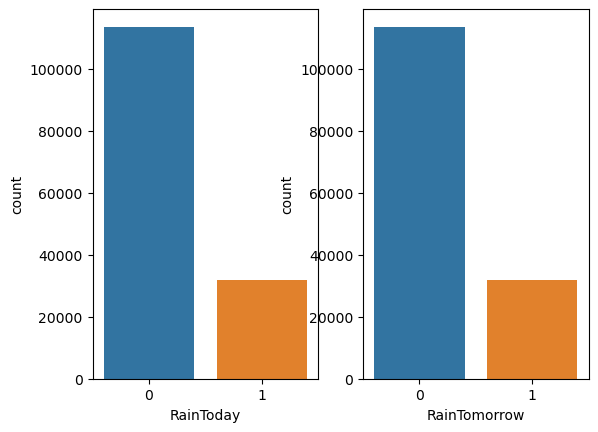

<Figure size 2000x3000 with 0 Axes>

In [15]:
fig, ax =plt.subplots(1,2)
print(df.RainToday.value_counts())
print(df.RainTomorrow.value_counts())

plt.figure(figsize=(20,30))
sns.countplot(data=df,x='RainToday',ax=ax[0])
sns.countplot(data=df,x='RainTomorrow',ax=ax[1])

## Melihat persentase data null dalam dataset

In [16]:
data_null = (df.isnull().sum() / len(df)) * 100
data_null

Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         0.000000
RainTomorrow      0.000000
Month             0.000000
Day               0.000000
Year              0.000000
dtype: float64

<Axes: >

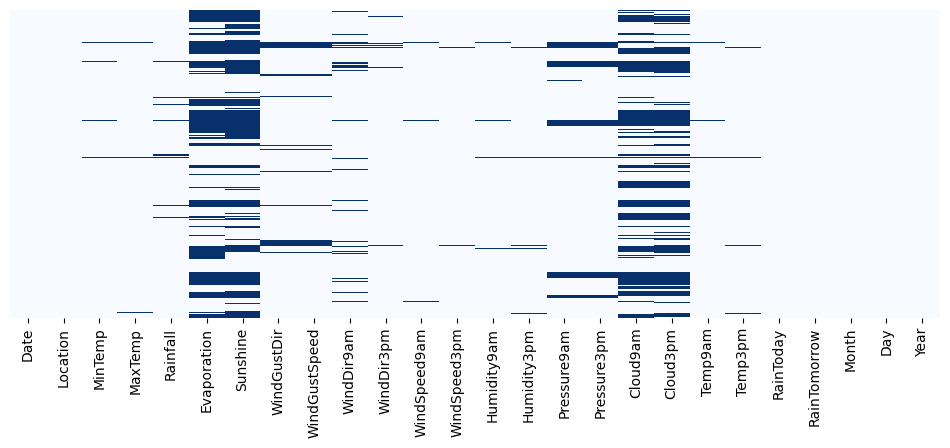

In [17]:
fig,ax = plt.subplots(1,1,figsize=(12,4))
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='Blues', ax=ax)

Dikarenakan ada banyak nya data yang bernilai null dari dataset yang mungkin dapat mengakibatkan tidak optimal kinerja machine learning nantinya, maka diperlukan analisa untuk tindakan yang akan dilakukan terhadap data null. Maka kita perlu melakukan cek terhadap outlier karena jika diisi dengan mean, mean sensitif terhadap outlier 

# EDA (Exploratory Data Analysis)

### Variability

In [18]:
df.describe().reset_index()

,index,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day,Year
0,count,145460,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,...,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000
1,mean,2013-04-04 21:08:51.907053568,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,...,1015.255889,4.447461,4.509930,16.990631,21.68339,0.219167,0.219146,6.399615,2.999684,2012.769751
2,min,2007-11-01 00:00:00,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,...,977.100000,0.000000,0.000000,-7.200000,-5.40000,0.000000,0.000000,1.000000,0.000000,2007.000000
3,25%,2011-01-11 00:00:00,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,...,1010.400000,1.000000,2.000000,12.300000,16.60000,0.000000,0.000000,3.000000,1.000000,2011.000000
4,50%,2013-06-02 00:00:00,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,...,1015.200000,5.000000,5.000000,16.700000,21.10000,0.000000,0.000000,6.000000,3.000000,2013.000000
5,75%,2015-06-14 00:00:00,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,...,1020.000000,7.000000,7.000000,21.600000,26.40000,0.000000,0.000000,9.000000,5.000000,2015.000000
6,max,2017-06-25 00:00:00,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,...,1039.600000,9.000000,9.000000,40.200000,46.70000,1.000000,1.000000,12.000000,6.000000,2017.000000
7,std,NaN,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,...,7.037414,2.887159,2.720357,6.488753,6.93665,0.413683,0.413669,3.427262,1.999292,2.537684


## Membuat box plot

### Evaporation dan Sunshine

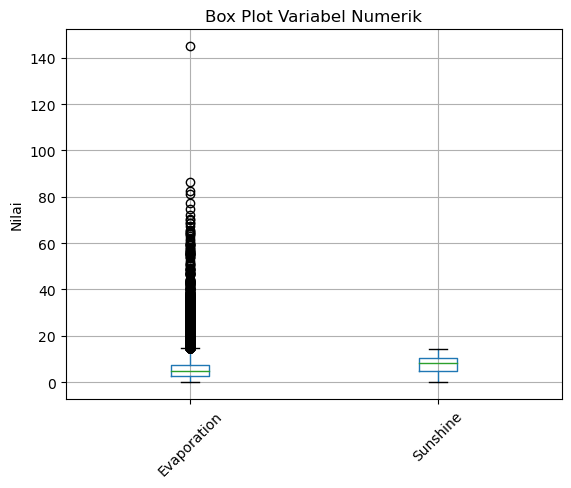

In [19]:
df.boxplot(column=['Evaporation', 'Sunshine'])
plt.title('Box Plot Variabel Numerik')
plt.ylabel('Nilai')
plt.xticks(rotation=45)
plt.show()

Terlihat bahwa Evaporation memiliki banyak outlier maka dilakukan input menggunakan KNN imputer untuk mengisi nilai Null

## Membuat histogram untuk melihat apakah distribusi normal atau tidak

In [20]:
numeric_cols = df[['MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine','WindGustSpeed',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm']]

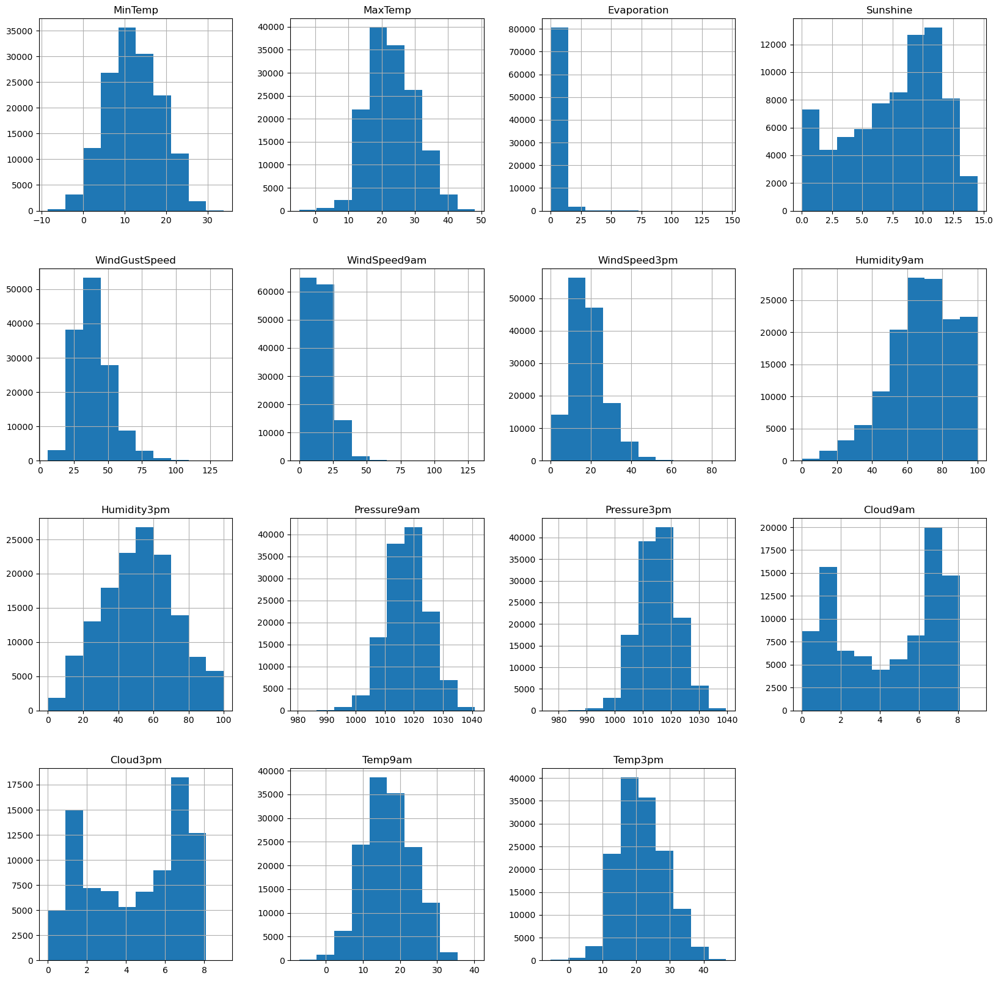

In [21]:
numeric_cols.hist(figsize=(20,20))
plt.show()

Terlihat ada beberapa kolom yang mempunyai 
- distribusi normal seperti MinTemp, Sunshine, Humidity9am, Humidity3pm, ,Preasure9am, Preasure3pm, Temp3pm, Temp9am
- Untuk Evaporation terlihat skewness negatif menunjukkan bahwa ekor distribusi lebih panjang di sebelah kiri dari nilai pusat.

## Range

In [22]:
# Menghitung rentang untuk keseluruhan DataFrame
data_range = numeric_cols.max() - numeric_cols.min()

In [23]:
data_range

MinTemp           42.4
MaxTemp           52.9
Evaporation      145.0
Sunshine          14.5
WindGustSpeed    129.0
WindSpeed9am     130.0
WindSpeed3pm      87.0
Humidity9am      100.0
Humidity3pm      100.0
Pressure9am       60.5
Pressure3pm       62.5
Cloud9am           9.0
Cloud3pm           9.0
Temp9am           47.4
Temp3pm           52.1
dtype: float64

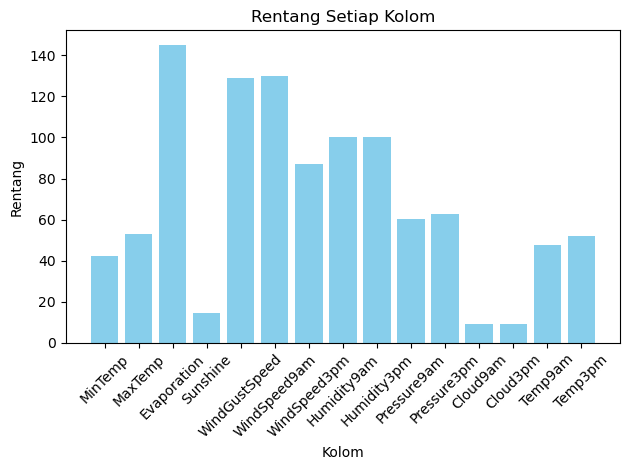

In [24]:
# Plotting bar plot
plt.bar(data_range.index, data_range.values, color='skyblue')
plt.title('Rentang Setiap Kolom')
plt.xlabel('Kolom')
plt.ylabel('Rentang')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Central Tendency

## Box Plot

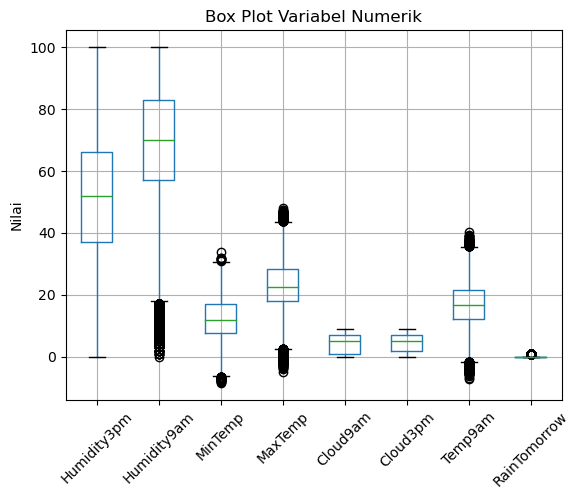

In [25]:
df.boxplot(column=['Humidity3pm', 'Humidity9am', 'MinTemp', 'MaxTemp', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'RainTomorrow'])
plt.title('Box Plot Variabel Numerik')
plt.ylabel('Nilai')
plt.xticks(rotation=45)
plt.show()

In [26]:
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Hitung central tendency
mean_per_column = df[numeric_cols].mean()
median_per_column = df[numeric_cols].median()
mode_per_column = df[numeric_cols].mode().iloc[0]  # Mode dapat memiliki lebih dari satu nilai

In [27]:
# Hitung central tendency
mean_per_column = df[numeric_cols].mean()
median_per_column = df[numeric_cols].median()
mode_per_column = df[numeric_cols].mode().iloc[0]

### Mean

In [28]:
mean_per_column

MinTemp            12.194034
MaxTemp            23.221348
Rainfall            2.360918
Evaporation         5.468232
Sunshine            7.611178
WindGustSpeed      40.035230
WindSpeed9am       14.043426
WindSpeed3pm       18.662657
Humidity9am        68.880831
Humidity3pm        51.539116
Pressure9am      1017.649940
Pressure3pm      1015.255889
Cloud9am            4.447461
Cloud3pm            4.509930
Temp9am            16.990631
Temp3pm            21.683390
RainToday           0.219167
RainTomorrow        0.219146
dtype: float64

### Median

In [29]:
median_per_column

MinTemp            12.0
MaxTemp            22.6
Rainfall            0.0
Evaporation         4.8
Sunshine            8.4
WindGustSpeed      39.0
WindSpeed9am       13.0
WindSpeed3pm       19.0
Humidity9am        70.0
Humidity3pm        52.0
Pressure9am      1017.6
Pressure3pm      1015.2
Cloud9am            5.0
Cloud3pm            5.0
Temp9am            16.7
Temp3pm            21.1
RainToday           0.0
RainTomorrow        0.0
dtype: float64

## Mode

In [30]:
mode_per_column

MinTemp            11.0
MaxTemp            20.0
Rainfall            0.0
Evaporation         4.0
Sunshine            0.0
WindGustSpeed      35.0
WindSpeed9am        9.0
WindSpeed3pm       13.0
Humidity9am        99.0
Humidity3pm        52.0
Pressure9am      1016.4
Pressure3pm      1015.3
Cloud9am            7.0
Cloud3pm            7.0
Temp9am            17.0
Temp3pm            20.0
RainToday           0.0
RainTomorrow        0.0
Name: 0, dtype: float64

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 26 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           145460 non-null  datetime64[ns]
 1   Location       145460 non-null  object        
 2   MinTemp        143975 non-null  float64       
 3   MaxTemp        144199 non-null  float64       
 4   Rainfall       142199 non-null  float64       
 5   Evaporation    82670 non-null   float64       
 6   Sunshine       75625 non-null   float64       
 7   WindGustDir    135134 non-null  object        
 8   WindGustSpeed  135197 non-null  float64       
 9   WindDir9am     134894 non-null  object        
 10  WindDir3pm     141232 non-null  object        
 11  WindSpeed9am   143693 non-null  float64       
 12  WindSpeed3pm   142398 non-null  float64       
 13  Humidity9am    142806 non-null  float64       
 14  Humidity3pm    140953 non-null  float64       
 15  

# Data Visualization

## Jumlah Hujan pertahun dari dataset

In [32]:
rain_per_year = df[df['RainToday'] == 1].groupby('Year')['RainToday'].count()

In [33]:
rain_per_year

Year
2007      19
2008     515
2009    3595
2010    4009
2011    3735
2012    3394
2013    3465
2014    3554
2015    3651
2016    4180
2017    1763
Name: RainToday, dtype: int64

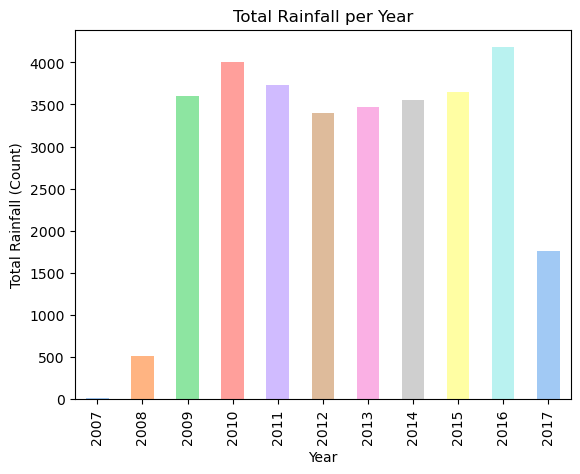

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming rain_per_year is already calculated
rain_per_year.plot(kind='bar', color=sns.color_palette('pastel'))
plt.xlabel('Year')
plt.ylabel('Total Rainfall (Count)')
plt.title('Total Rainfall per Year')
plt.show()


Dari plot diatas dapat dilihat bahwa curah hujan paling tinggi adala tahun 2016

## Identifikasi arah angin jam 9 pagi, jam 3 sore

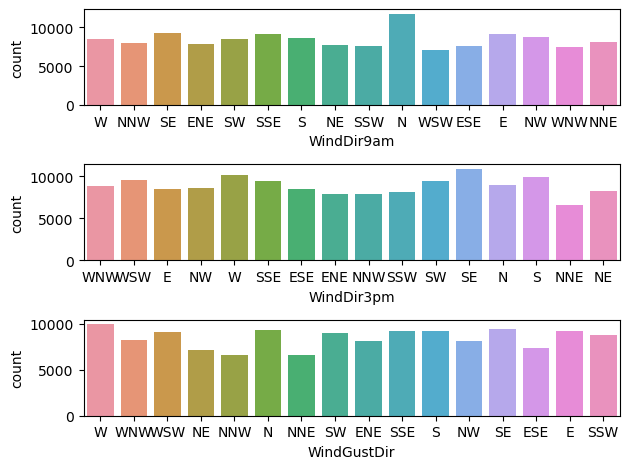

<Figure size 1000x1000 with 0 Axes>

In [35]:
# Mengidentifikasi arah angin jam 9 pagi, jam 3 sore
fig, ax =plt.subplots(3,1)
plt.figure(figsize=(10,10))

sns.countplot(data=df,x='WindDir9am',ax=ax[0])
sns.countplot(data=df,x='WindDir3pm',ax=ax[1])
sns.countplot(data=df,x='WindGustDir',ax=ax[2])
fig.tight_layout()

- Pada pukul 9 pagi hari, arah angin cenderung lebih banyak ke utara
- Pada pukul 3 sore, arah angin cenderung lebih banyakj ke SW, NNW, S, SE, W
- Arah angin selama 24 jam dapat dilihat di plot diatas.

## Curah Hujan Perbulan

In [36]:
# Hitung jumlah curah hujan per bulan
rainfall_per_month = df.groupby('Month')['Rainfall'].sum()

# Set ulang indeks DataFrame
rainfall_per_month_reset = rainfall_per_month.reset_index()
rainfall_per_month_reset

,Month,Rainfall
0,1,35364.7
1,2,33560.7
2,3,36694.8
3,4,26390.5
4,5,26137.6
5,6,34476.8
6,7,25727.8
7,8,23937.5
8,9,21429.3
9,10,19071.6


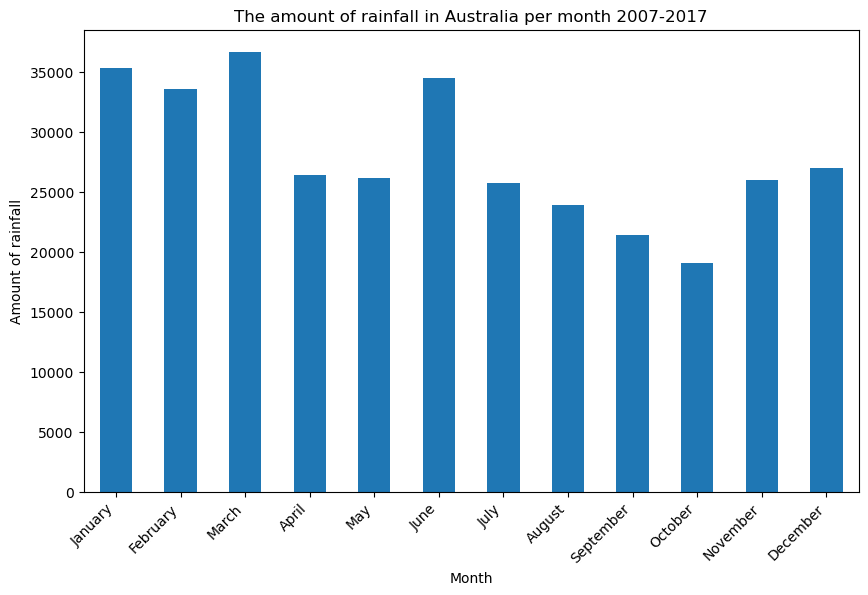

In [37]:
# Ganti nama indeks agar sesuai dengan kode sebelumnya
rainfall_per_month.index = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Plot
plt.figure(figsize=(10, 6))
ax = rainfall_per_month.plot(kind='bar')
plt.title('The amount of rainfall in Australia per month 2007-2017')
plt.xlabel('Month')
plt.ylabel('Amount of rainfall')

# Rotasi teks pada label sumbu x
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.show()

## Tingkat curah hujan berdasarkan lokasi

In [38]:
import plotly.express as px

In [39]:
location = df[df['RainToday'] == 1].sort_values(by=['Location'])

In [40]:
print("Unique locations and their counts :")
location = location["Location"].value_counts()
location = location.reset_index()
location.columns= ["Location", "Counts"]
print(location)

Unique locations and their counts :
            Location  Counts
0           Portland    1094
1             Cairns     950
2            Walpole     949
3       MountGambier     921
4           Dartmoor     921
5      NorfolkIsland     919
6             Albany     902
7        Witchcliffe     879
8       CoffsHarbour     869
9             Sydney     866
10            Darwin     852
11       MountGinini     819
12         NorahHead     808
13          Ballarat     781
14         GoldCoast     775
15     SydneyAirport     774
16            Hobart     762
17          Watsonia     738
18         Newcastle     731
19        Wollongong     713
20          Brisbane     709
21        Launceston     700
22       Williamtown     700
23          Adelaide     689
24  MelbourneAirport     653
25             Perth     645
26              Sale     643
27         Melbourne     636
28          Canberra     629
29            Albury     617
30           Penrith     595
31         Nuriootpa     592
32     

In [41]:
fig = px.treemap(location, path=['Location'], values='Counts', color='Counts', title="Tngkat hujan dari yang tertinggi ke terendah")
fig.show()

In [42]:
fig = px.histogram(df, x="Evaporation", title="Evaporation(mm)", color_discrete_sequence=["blue"])
fig.show()

In [43]:
print("Unique wind gust directions and their counts :")
windgustdir = df["WindGustDir"].value_counts()
windgustdir = windgustdir.reset_index()
windgustdir.columns= ["Wind Gust Direction", "Counts"]
print(windgustdir)

Unique wind gust directions and their counts :
   Wind Gust Direction  Counts
0                    W    9915
1                   SE    9418
2                    N    9313
3                  SSE    9216
4                    E    9181
5                    S    9168
6                  WSW    9069
7                   SW    8967
8                  SSW    8736
9                  WNW    8252
10                  NW    8122
11                 ENE    8104
12                 ESE    7372
13                  NE    7133
14                 NNW    6620
15                 NNE    6548


In [44]:
fig = px.bar(windgustdir, x="Wind Gust Direction", y="Counts", title="Arah hembusan angin berdasarkan yang tertinggi hingga terendah", color="Counts")
fig.show()

In [45]:
print("Unique wind gust speed in km/hr and their counts :")
windgustspd = df["WindGustSpeed"].value_counts()
windgustspd = windgustspd.reset_index()
windgustspd.columns= ["Wind Gust Speed", "Counts"]
print(windgustspd)

Unique wind gust speed in km/hr and their counts :
    Wind Gust Speed  Counts
0              35.0    9215
1              39.0    8794
2              31.0    8428
3              37.0    8047
4              33.0    7933
..              ...     ...
62            122.0       3
63            126.0       2
64            124.0       2
65            130.0       1
66              6.0       1

[67 rows x 2 columns]


In [46]:
fig = px.bar(windgustspd, x="Wind Gust Speed", y="Counts", title= "Kecepatan arah angin (Km/Jam) berdasarkan yang tertinggi Ke terendah", color="Counts")
fig.show()

In [47]:
from IPython.core.display import display, HTML
display(HTML("<div class='tableauPlaceholder' id='viz1652712003286' style='position: relative'><noscript><a href='#'><img alt='RainFall Per Location ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ra&#47;RainFallinLocations&#47;Sheet1&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='RainFallinLocations&#47;Sheet1' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ra&#47;RainFallinLocations&#47;Sheet1&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1652712003286');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';var scriptElement = document.createElement('script');scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js'; vizElement.parentNode.insertBefore(scriptElement, vizElement); </script>"))

/var/folders/v5/87yl3yfj69j7yrypnbp8ghzm0000gp/T/ipykernel_650/832404541.py:1: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



In [48]:
loctemp = df.groupby("Location")[["MinTemp", "MaxTemp"]].mean().round()
loctemp = loctemp.reset_index()
loctemp.columns= ["Location","MinTemp", "MaxTemp"]
print(loctemp)

            Location  MinTemp  MaxTemp
0           Adelaide     13.0     23.0
1             Albany     13.0     20.0
2             Albury     10.0     23.0
3       AliceSprings     13.0     29.0
4      BadgerysCreek     11.0     24.0
5           Ballarat      7.0     18.0
6            Bendigo      9.0     22.0
7           Brisbane     16.0     26.0
8             Cairns     21.0     30.0
9           Canberra      7.0     21.0
10             Cobar     13.0     26.0
11      CoffsHarbour     14.0     24.0
12          Dartmoor      9.0     20.0
13            Darwin     23.0     33.0
14         GoldCoast     17.0     26.0
15            Hobart      9.0     18.0
16         Katherine     21.0     35.0
17        Launceston      8.0     19.0
18         Melbourne     12.0     21.0
19  MelbourneAirport     10.0     20.0
20           Mildura     11.0     25.0
21             Moree     13.0     27.0
22      MountGambier      9.0     20.0
23       MountGinini      4.0     12.0
24         Newcastle     

In [49]:
fig = px.bar(loctemp, x="Location", y=["MinTemp", "MaxTemp"], title="Lokasi hujan berdasarkan rata-rata suhu minimum rata-rata dan suhu maksimum")
fig.show()

In [50]:
fig = px.histogram(df, x='Location', title='RainToday', color='RainToday')
fig.show()

In [51]:
fig = px.histogram(df, x='Location', title='Rain Tomorrow', color='RainTomorrow')
fig.show()

## Jumlah rata-rata curah hujan untuk setiap kota di Australia dan frekuensi setiap curah hujan


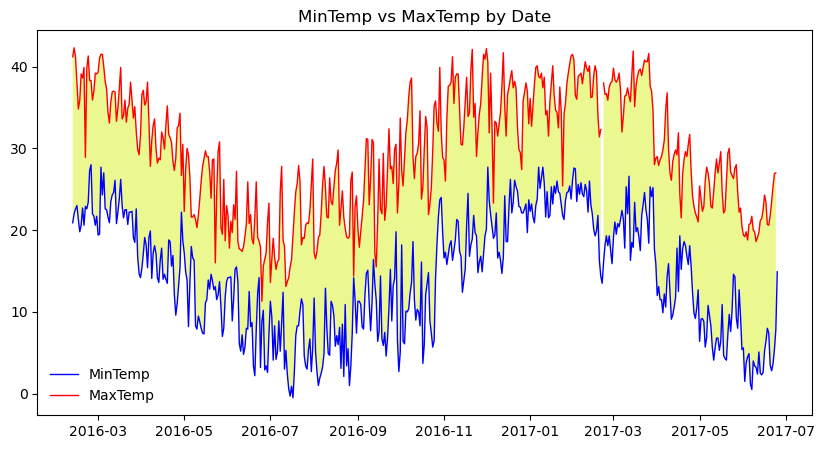

In [52]:
df_date = df.iloc[-500:,:]
plt.figure(figsize=[10,5])
plt.plot(df_date['Date'],df_date['MinTemp'],color='blue',linewidth=1, label= 'MinTemp')
plt.plot(df_date['Date'],df_date['MaxTemp'],color='red',linewidth=1, label= 'MaxTemp')
plt.fill_between(df_date['Date'],df_date['MinTemp'],df_date['MaxTemp'], facecolor = '#EBF78F')
plt.title('MinTemp vs MaxTemp by Date')
plt.legend(loc='lower left', frameon=False)
plt.show()

# Data Preprocessing for Model

## Membuat variabel dataset baru df_model

In [53]:
df_model = df.copy()

In [54]:
df_model.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday            0
RainTomorrow         0
Month                0
Day                  0
Year                 0
dtype: int64

In [55]:
category = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']

In [56]:
le = preprocessing.LabelEncoder()

# Mengubah data kategori ke data numerik pada DataFrame df
for col in category:
    df_model[col] = le.fit_transform(df_model[col])

In [57]:
df_model.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day,Year
0,2008-12-01,2,13.4,22.9,0.6,NaN,NaN,13,44.0,13,...,1007.1,8.0,NaN,16.9,21.8,0,0,12,0,2008
1,2008-12-02,2,7.4,25.1,0.0,NaN,NaN,14,44.0,6,...,1007.8,NaN,NaN,17.2,24.3,0,0,12,1,2008
2,2008-12-03,2,12.9,25.7,0.0,NaN,NaN,15,46.0,13,...,1008.7,NaN,2.0,21.0,23.2,0,0,12,2,2008
3,2008-12-04,2,9.2,28.0,0.0,NaN,NaN,4,24.0,9,...,1012.8,NaN,NaN,18.1,26.5,0,0,12,3,2008
4,2008-12-05,2,17.5,32.3,1.0,NaN,NaN,13,41.0,1,...,1006.0,7.0,8.0,17.8,29.7,0,0,12,4,2008


## Menghapus nilai null pada Sunshine dan Evaporation

In [58]:
df_model.dropna(subset=['Sunshine'], inplace=True)
df_model.dropna(subset=['Evaporation'], inplace=True)

In [59]:
df_model

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day,Year
6049,2009-01-01,10,17.9,35.2,0.0,12.0,12.3,11,48.0,1,...,1004.4,2.0,5.0,26.6,33.4,0,0,1,3,2009
6050,2009-01-02,10,18.4,28.9,0.0,14.8,13.0,8,37.0,10,...,1012.1,1.0,1.0,20.3,27.0,0,0,1,4,2009
6051,2009-01-03,10,15.5,34.1,0.0,12.6,13.3,9,30.0,16,...,1011.6,NaN,1.0,NaN,32.7,0,0,1,5,2009
6052,2009-01-04,10,19.4,37.6,0.0,10.8,10.6,5,46.0,5,...,1009.2,1.0,6.0,28.7,34.9,0,0,1,6,2009
6053,2009-01-05,10,21.9,38.4,0.0,11.4,12.2,14,31.0,14,...,1009.1,1.0,5.0,29.1,35.6,0,0,1,0,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,2017-06-20,13,19.3,33.4,0.0,6.0,11.0,1,35.0,9,...,1010.5,0.0,1.0,24.5,32.3,0,0,6,1,2017
142299,2017-06-21,13,21.2,32.6,0.0,7.6,8.6,0,37.0,9,...,1011.2,7.0,0.0,24.8,32.0,0,0,6,2,2017
142300,2017-06-22,13,20.7,32.8,0.0,5.6,11.0,0,33.0,0,...,1011.8,0.0,0.0,24.8,32.1,0,0,6,3,2017
142301,2017-06-23,13,19.5,31.8,0.0,6.2,10.6,2,26.0,9,...,1010.7,1.0,1.0,24.8,29.2,0,0,6,4,2017


In [60]:
df_model.isnull().sum()

Date                0
Location            0
MinTemp           617
MaxTemp           589
Rainfall          911
Evaporation         0
Sunshine            0
WindGustDir         0
WindGustSpeed    4328
WindDir9am          0
WindDir3pm          0
WindSpeed9am      215
WindSpeed3pm      432
Humidity9am       913
Humidity3pm      1089
Pressure9am       653
Pressure3pm       660
Cloud9am         7052
Cloud3pm         8581
Temp9am           652
Temp3pm           847
RainToday           0
RainTomorrow        0
Month               0
Day                 0
Year                0
dtype: int64

### Melakukan Pendekatan dengan menggunakan KNN imputer

KNNImputer menggunakan pendekatan berbasis tetangga terdekat untuk mengestimasi nilai-nilai yang hilang.


In [61]:
from sklearn.impute import KNNImputer

# Membuat objek imputer KNN
imputer = KNNImputer(n_neighbors=5)

# Menggunakan imputer untuk mengisi nilai null
df_model['WindGustSpeed']=imputer.fit_transform(df_model[['WindGustSpeed']])
df_model['Humidity9am']=imputer.fit_transform(df_model[['Humidity9am']])
df_model['Humidity3pm']=imputer.fit_transform(df_model[['Humidity3pm']])
df_model['Pressure9am']=imputer.fit_transform(df_model[['Pressure9am']])
df_model['Pressure3pm']=imputer.fit_transform(df_model[['Pressure3pm']])
df_model['Cloud9am']=imputer.fit_transform(df_model[['Cloud9am']])
df_model['Cloud3pm']=imputer.fit_transform(df_model[['Cloud3pm']])
df_model['Temp9am']=imputer.fit_transform(df_model[['Temp9am']])
df_model['Temp3pm']=imputer.fit_transform(df_model[['Temp3pm']])
df_model['Rainfall']=imputer.fit_transform(df_model[['Rainfall']])
df_model['MinTemp']=imputer.fit_transform(df_model[['MinTemp']])
df_model['MaxTemp']=imputer.fit_transform(df_model[['MaxTemp']])
df_model['WindSpeed9am']=imputer.fit_transform(df_model[['WindSpeed9am']])
df_model['WindSpeed3pm']=imputer.fit_transform(df_model[['WindSpeed3pm']])

In [62]:
# Menghitung persentase dari jumlah nilai yang hilang (missing values) pada setiap kolom DataFrame 
df_model.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Month            0
Day              0
Year             0
dtype: int64

## Mencari Korelasi

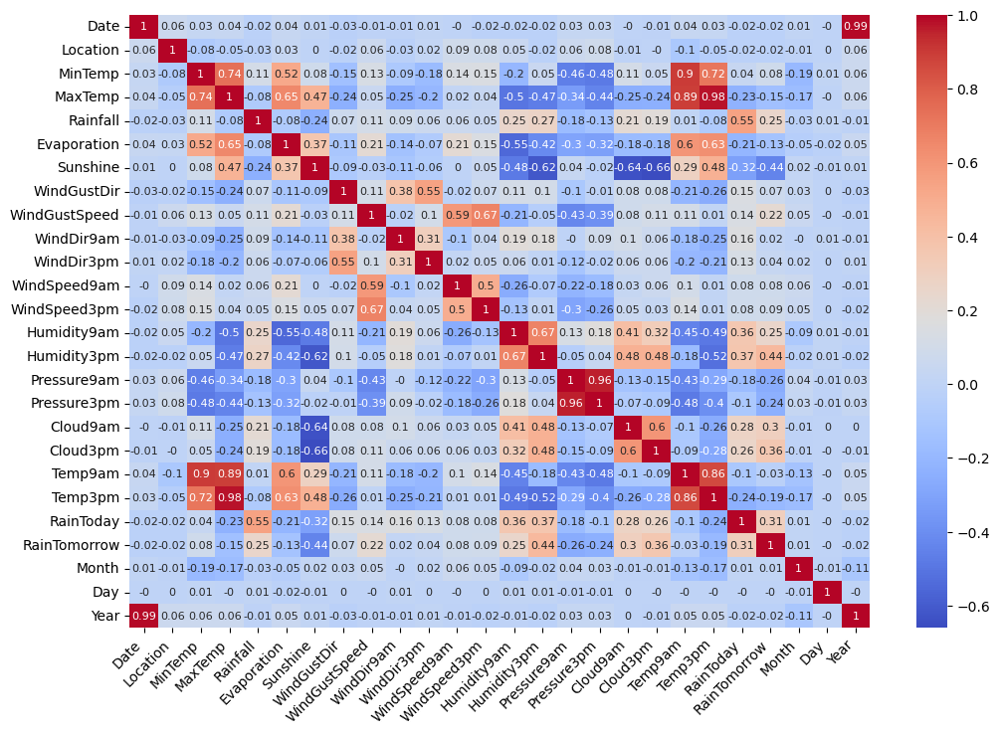

In [63]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_model.corr().round(2), annot=True, cmap='coolwarm', 
            xticklabels=df_model.corr().columns, 
            yticklabels=df_model.corr().columns, 
            annot_kws={"size": 8})
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.show()

In [64]:
df_model[['Temp3pm','MaxTemp']]

,Temp3pm,MaxTemp
6049,33.4,35.2
6050,27.0,28.9
6051,32.7,34.1
6052,34.9,37.6
6053,35.6,38.4
...,...,...
142298,32.3,33.4
142299,32.0,32.6
142300,32.1,32.8
142301,29.2,31.8


 <h1 style="text-align:center;">Modeling</h1>

In [65]:
# Pilih kolom-kolom yang akan dijadikan fitur
feature_cols = [
'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir3pm','WindDir9am',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am','RainToday','Month', 'Day', 'Temp3pm'
]

# Pilih kolom target yang akan diprediksi
target_col = ['RainTomorrow']

# Logistic Regression

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [92]:
X = df_model[feature_cols]
y = df_model[target_col].values
split_test_size = 0.20

In [93]:
y = y.ravel()

### Train Model

In [94]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=42)

In [95]:
print("{0:0.2f}% ada pada training set". format((len(X_train)/len(df_model.index)) * 100))
print("{0:0.2f}% ada pada test set". format((len(X_test)/len(df_model.index)) * 100))

80.00% ada pada training set
20.00% ada pada test set


In [96]:
# Defenisi Model
Lr = LogisticRegression(solver='liblinear', random_state=42)

In [97]:
# Latih model pada data pelatihan
Lr.fit(X_train, y_train)

# Lakukan prediksi pada data pengujian
y_pred = Lr.predict(X_test)

# Evaluasi model
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8513693352945296
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.95      0.91     11104
           1       0.74      0.52      0.61      3173

    accuracy                           0.85     14277
   macro avg       0.80      0.73      0.76     14277
weighted avg       0.84      0.85      0.84     14277



## Confusion Matrix

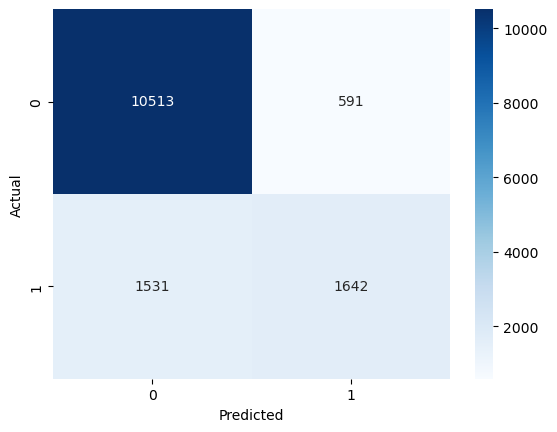

In [98]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = Lr.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=Lr.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=Lr.classes_, yticklabels=Lr.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## Melihat hasil prediksi di dataframe

In [99]:
# Membuat DataFrame untuk hasil prediksi
result_df = X_test.copy()
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

result_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Temp3pm,Actual,Predicted
82545,12,3.4,15.7,0.2,1.8,5.5,0,24.000000,2,2,...,1023.4,4.27875,4.349326,6.6,0,6,1,15.1,0,0
68980,18,8.4,16.5,1.6,4.0,10.1,3,59.000000,7,3,...,1009.2,1.00000,6.000000,10.7,1,8,1,16.1,0,0
136906,3,19.3,32.5,0.2,3.2,11.2,4,37.000000,1,0,...,1006.4,7.00000,7.000000,26.1,0,3,2,31.7,0,0
110647,1,13.2,22.5,0.0,4.2,10.3,16,40.649909,15,12,...,1015.0,4.00000,6.000000,19.3,0,11,2,19.2,0,1
110702,1,16.8,23.1,0.0,7.2,11.3,16,40.649909,10,2,...,1009.4,3.00000,4.000000,21.8,0,12,1,21.2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119570,32,9.0,19.2,3.0,2.2,7.8,12,28.000000,12,4,...,1020.6,5.00000,7.000000,13.3,1,7,3,17.8,1,0
132807,15,8.8,14.7,14.4,0.8,2.9,11,35.000000,9,11,...,1008.6,7.00000,7.000000,11.5,1,11,0,12.6,0,0
38253,42,21.8,39.6,0.0,12.0,12.2,5,35.000000,5,4,...,1014.7,4.00000,7.000000,28.2,0,12,3,37.5,0,0
136366,3,20.2,32.1,0.0,15.6,11.3,15,63.000000,15,13,...,1009.1,0.00000,0.000000,27.1,0,9,1,31.4,0,0


In [100]:
result_df['Predicted'].value_counts()

Predicted
0    12044
1     2233
Name: count, dtype: int64

In [101]:
result_true = result_df[result_df['Predicted'] == 1]

In [102]:
result_true.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Temp3pm,Actual,Predicted
110647,1,13.2,22.5,0.0,4.2,10.3,16,40.649909,15,12,...,1015.0,4.00000,6.000000,19.3,0,11,2,19.2,0,1
97334,0,9.4,16.0,5.2,1.0,2.7,12,46.000000,15,8,...,1017.8,4.27875,4.349326,12.9,1,5,2,15.3,1,1
77214,33,7.0,12.8,2.2,2.8,6.2,12,54.000000,15,12,...,1027.9,6.00000,8.000000,8.4,1,5,2,12.2,1,1
21408,27,18.6,21.4,0.0,4.0,3.4,7,39.000000,14,7,...,1013.2,7.00000,8.000000,20.0,0,10,5,20.2,0,1
139670,13,25.3,30.2,5.4,5.2,2.3,7,30.000000,7,11,...,1003.3,7.00000,7.000000,27.7,1,1,0,28.5,1,1


### Classification Report Logistic Regression

Model Regresi Logistik berhasil mencapai akurasi sebesar 85,14% pada dataset uji. Berikut adalah laporan klasifikasi secara rinci:

|    | Presisi | Recall | F1-Score | Dukungan |
|----|---------|--------|----------|----------|
| 0  | 0,87    | 0,95   | 0,91     | 11104    |
| 1  | 0,74    | 0,52   | 0,61     | 3173     |

- **Akurasi:** 85,14%
- **Presisi Rata-rata (Macro):** 0,80
- **Recall Rata-rata (Macro):** 0,73
- **F1-Score Rata-rata (Macro):** 0,76
- **Presisi Rata-rata (Weighted):** 0,84
- **Recall Rata-rata (Weighted):** 0,85
- **F1-Score Rata-rata (Weighted):** 0,84

### Confusion Matrix:

|               | Kelas 0 Diprediksi | Kelas 1 Diprediksi |
|---------------|---------------------|---------------------|
| Aktual Kelas 0| 10513               | 591                 |
| Aktual Kelas 1| 1531                | 1642                |

Pada matriks kebingungan:
- Elemen diagonal mewakili jumlah prediksi yang benar.
- Elemen di luar diagonal adalah klasifikasi yang salah, di mana baris mewakili kelas aktual, dan kolom mewakili kelas yang diprediksi.

Metrik-metrik ini memberikan wawasan tentang kinerja model untuk setiap kelas dan secara keseluruhan. Dikarekan jumlah false positif masih banyakm, maka akan dilakukan optimasi terhadap kinerja Logistic Regression

# Support Vector Machine

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [116]:
X = df_model[feature_cols].values
y = df_model[target_col].values
split_test_size = 0.20

In [117]:
y = y.ravel()

## Train Model

In [118]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=42)

In [119]:
from sklearn import svm

model_svm = svm.SVC(kernel='rbf')
model_svm.fit(X_train, y_train)
y_pred = model_svm.predict(X_test)

In [120]:
# Latih model_svm pada data pelatihan
model_svm.fit(X_train,y_train)

# Lakukan prediksi pada data pengujian
y_pred = model_svm.predict(X_test)

# Evaluasi model_svm
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.840092456398403
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.98      0.90     11104
           1       0.82      0.36      0.50      3173

    accuracy                           0.84     14277
   macro avg       0.83      0.67      0.70     14277
weighted avg       0.84      0.84      0.82     14277



**Hasil Evaluasi Model:**

- **Akurasi (Accuracy):** Model ini berhasil mencapai akurasi sekitar 84%, menunjukkan kemampuannya untuk memprediksi dengan benar pada keseluruhan dataset uji.

- **Presisi dan Recall:**
  - Untuk kelas 0, model memiliki precision sebesar 84%, menunjukkan kemampuannya dalam mengidentifikasi dengan benar data yang sebenarnya termasuk ke dalam kelas 0. Recall yang tinggi (98%) menunjukkan kemampuannya dalam menemukan sebagian besar data kelas 0.
  - Untuk kelas 1, precision sekitar 82%, menunjukkan kemampuannya dalam mengidentifikasi dengan benar data yang sebenarnya termasuk ke dalam kelas 1. Namun, recall yang rendah (36%) menunjukkan kesulitan model dalam menemukan sebagian besar data kelas 1.

- **F1-Score:** F1-score yang dihasilkan adalah 0.90 untuk kelas 0 dan 0.50 untuk kelas 1, mencerminkan keseimbangan antara precision dan recall.

- **Kesimpulan:** Meskipun akurasi umumnya baik, terdapat ketidakseimbangan antara kelas 0 dan kelas 1, terutama dalam hal recall untuk kelas 1. Peningkatan kinerja model, terutama dalam mendeteksi data kelas 1, mungkin dapat dicapai melalui penyesuaian model atau pemilihan fitur yang lebih baik. Evaluasi lebih lanjut diperlukan untuk memahami aspek-aspek tertentu yang memengaruhi performa model ini.


## Evaluasi Model

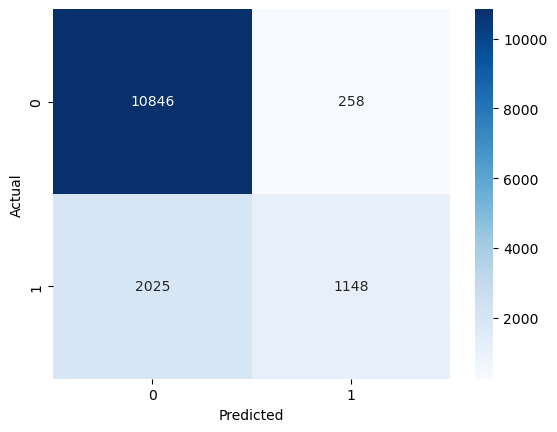

In [121]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = model_svm.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=model_svm.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=model_svm.classes_, yticklabels=model_svm.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Decision Tree Classifier

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [122]:
X = df_model[feature_cols]
y = df_model[target_col]
split_test_size = 0.20

In [123]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=100)

### Train Model

In [124]:
from sklearn.tree import DecisionTreeClassifier
Dtc = DecisionTreeClassifier(criterion='entropy', max_depth=9, min_samples_leaf=10)
Dtc = Dtc.fit(X_train, y_train)
y_pred = Dtc.predict(X_test)

### Confusion Matrix

In [125]:
# Evaluasi model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8419135672760384
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.93      0.90     11100
           1       0.69      0.52      0.59      3177

    accuracy                           0.84     14277
   macro avg       0.78      0.73      0.75     14277
weighted avg       0.83      0.84      0.83     14277



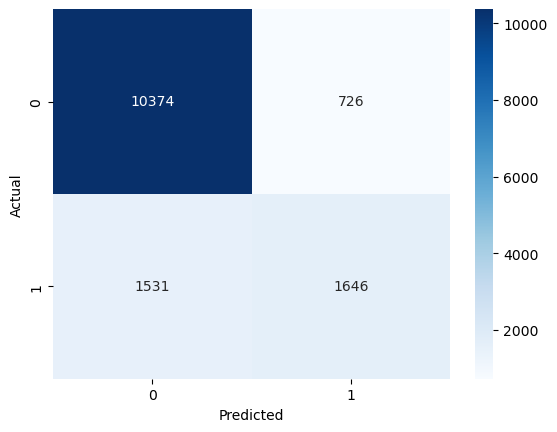

In [126]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = Dtc.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=Dtc.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=Dtc.classes_, yticklabels=Dtc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

- True Negatives (TN): 10135
Kasus yang benar-benar diprediksi sebagai negatif.


- False Positives (FP): 1566
Kasus yang salah diprediksi sebagai positif. Model melakukan kesalahan dengan memprediksi sesuatu sebagai positif padahal seharusnya negatif.


- False Negatives (FN): 694
Kasus yang salah diprediksi sebagai negatif. Model melakukan kesalahan dengan memprediksi sesuatu sebagai negatif padahal seharusnya positif.


- True Positives (TP): 1645
Kasus yang benar-benar diprediksi sebagai positif.

## Melihat hasil prediksi di dataframe

In [127]:
# Membuat DataFrame untuk hasil prediksi
result_df = X_test.copy()
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

result_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Temp3pm,Actual,Predicted
132686,15,10.5,16.7,0.0,2.4,8.4,14,70.0,6,13,...,1024.9,1.0,1.0,12.8,0,7,5,15.7,0,0
121219,31,17.4,27.4,0.0,10.6,11.2,11,56.0,11,8,...,1008.1,4.0,1.0,21.9,0,2,1,24.9,0,0
84592,7,24.6,31.6,0.0,7.2,10.2,0,39.0,4,6,...,1010.9,7.0,7.0,28.2,0,2,5,29.9,1,0
140429,13,24.5,33.2,0.0,3.2,6.6,2,61.0,14,9,...,1003.2,7.0,7.0,26.3,0,3,5,32.2,1,1
138026,3,-1.8,24.0,0.0,3.0,10.5,3,20.0,6,5,...,1015.1,0.0,0.0,10.7,0,7,0,23.3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88662,8,25.8,32.3,26.6,11.4,6.2,0,35.0,9,10,...,1002.9,7.0,6.0,29.0,1,3,4,30.8,0,1
65786,19,9.4,14.8,0.0,2.6,9.2,15,87.0,15,14,...,1004.9,4.0,3.0,13.7,0,8,0,12.7,0,0
100202,22,7.3,25.5,0.0,3.8,12.3,5,43.0,3,5,...,1017.5,1.0,3.0,16.6,0,10,3,23.9,0,0
71112,20,8.8,22.9,0.0,7.2,12.6,12,37.0,13,12,...,1013.6,5.0,1.0,15.6,0,12,1,21.0,0,0


In [128]:
result_df['Predicted'].value_counts()

Predicted
0    11905
1     2372
Name: count, dtype: int64

In [129]:
result_true = result_df[result_df['Predicted'] == 1]

In [130]:
result_true.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Temp3pm,Actual,Predicted
140429,13,24.5,33.2,0.0,3.2,6.6,2,61.0,14,9,...,1003.2,7.0,7.0,26.3,0,3,5,32.2,1,1
118217,32,12.6,17.2,19.0,2.4,1.9,3,54.0,5,5,...,1002.7,8.0,7.0,13.1,1,8,3,16.9,1,1
87870,8,22.5,27.0,18.8,6.8,0.7,10,48.0,9,10,...,1013.9,7.0,8.0,25.2,1,10,5,23.6,1,1
38063,42,7.8,14.0,7.6,2.4,0.1,1,35.0,1,0,...,1008.2,7.0,8.0,11.3,1,6,2,13.8,1,1
78589,44,8.5,13.6,0.4,3.6,4.9,3,67.0,3,6,...,1004.0,1.0,5.0,10.7,0,8,1,12.5,1,1


### Conclusion
Model ini memiliki akurasi sekitar 84%, dan memiliki presisi yang cukup baik untuk mendeteksi hujan:1, dan tidak hujan:2. Akan tetapi jumlah false positif masih banyak

# Random Forrest Classifier

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [131]:
X = df_model[feature_cols]
y = df_model[target_col].values
split_test_size = 0.20

In [132]:
y = y.ravel()

### Train Model

In [133]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=42)

In [134]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=100)

In [135]:
rfc = rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

## Evaluasi Model

In [136]:
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8639069832597884
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.96      0.92     11104
           1       0.78      0.54      0.64      3173

    accuracy                           0.86     14277
   macro avg       0.83      0.75      0.78     14277
weighted avg       0.86      0.86      0.85     14277



## Confusion Matrix

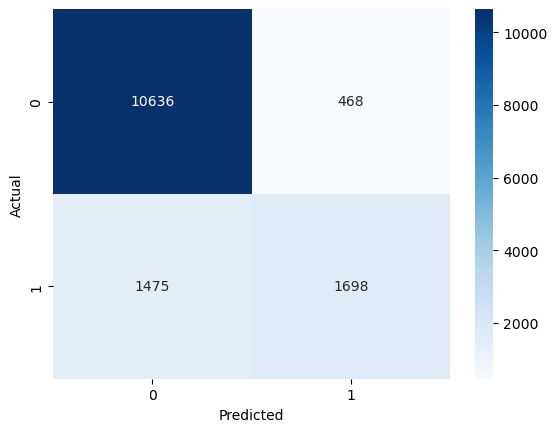

In [137]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = rfc.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=rfc.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=rfc.classes_, yticklabels=rfc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


- **True Negatives (TN):** 10,391
  - Menunjukkan bahwa 10,396 dari sampel yang sebenarnya negatif berhasil diprediksi dengan benar.

- **False Positives (FP):** 1460
  - Mengindikasikan bahwa 484 dari sampel yang sebenarnya negatif salah diprediksi sebagai positif.

- **False Negatives (FN):** 489
  - Menunjukkan bahwa 1,439 dari sampel yang sebenarnya positif salah diprediksi sebagai negatif.

- **True Positives (TP):** 1,700
  - Menunjukkan bahwa 1,721 dari sampel yang sebenarnya positif berhasil diprediksi dengan benar.

In [138]:
# Membuat DataFrame untuk hasil prediksi
result_df = X_test.copy()
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

result_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,Month,Day,Temp3pm,Actual,Predicted
82545,12,3.4,15.7,0.2,1.8,5.5,0,24.000000,2,2,...,1023.4,4.27875,4.349326,6.6,0,6,1,15.1,0,0
68980,18,8.4,16.5,1.6,4.0,10.1,3,59.000000,7,3,...,1009.2,1.00000,6.000000,10.7,1,8,1,16.1,0,0
136906,3,19.3,32.5,0.2,3.2,11.2,4,37.000000,1,0,...,1006.4,7.00000,7.000000,26.1,0,3,2,31.7,0,0
110647,1,13.2,22.5,0.0,4.2,10.3,16,40.649909,15,12,...,1015.0,4.00000,6.000000,19.3,0,11,2,19.2,0,0
110702,1,16.8,23.1,0.0,7.2,11.3,16,40.649909,10,2,...,1009.4,3.00000,4.000000,21.8,0,12,1,21.2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119570,32,9.0,19.2,3.0,2.2,7.8,12,28.000000,12,4,...,1020.6,5.00000,7.000000,13.3,1,7,3,17.8,1,0
132807,15,8.8,14.7,14.4,0.8,2.9,11,35.000000,9,11,...,1008.6,7.00000,7.000000,11.5,1,11,0,12.6,0,1
38253,42,21.8,39.6,0.0,12.0,12.2,5,35.000000,5,4,...,1014.7,4.00000,7.000000,28.2,0,12,3,37.5,0,0
136366,3,20.2,32.1,0.0,15.6,11.3,15,63.000000,15,13,...,1009.1,0.00000,0.000000,27.1,0,9,1,31.4,0,0


In [139]:
result_df['Predicted'].value_counts()

Predicted
0    12111
1     2166
Name: count, dtype: int64

Model ini mampu memprediksi tidak hujan:0 lebih banyak dibandingkan Decission Tree Classifier, memprediksi hujan:1 lebih sedikit dibandingkan Decission Tree Classifier. Tetapi memiliki accuracy dan recall yang lebih baik dibandingkan Decission Tree

## Finding Important Features in Scikit-learn

In [140]:
feature_names = X.columns

In [141]:
feature_imp = pd.Series(rfc.feature_importances_, index=feature_names).sort_values(ascending=False)

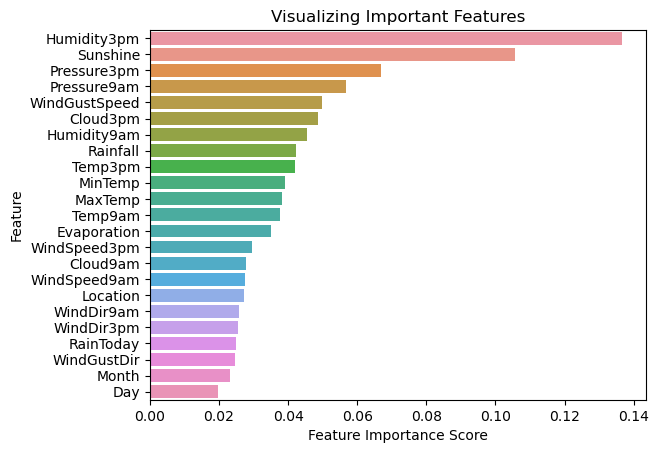

In [142]:
import seaborn as sns
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add Labels to graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Feature')
plt.title("Visualizing Important Features")
plt.show()

Dari plot diatas dapat membantu dalam memahami faktor-faktor yang paling berpengaruh dalam membuat prediksi model. Ini dapat memberikan wawasan tentang variabel mana yang memiliki dampak paling besar terhadap hasil prediksi. yang paling berpengaruh di model ini adalah Humidity3pm, Humidity dalam cuaca merujuk pada sejauh mana udara terkandung dengan uap air atau kelembapan.

# K-Nearest-Neighbors

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [143]:
X = df_model[feature_cols].values
y = df_model[target_col].values
split_test_size = 0.20

In [144]:
y = y.ravel()

### Train Model

In [145]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=42)

In [146]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=9)

In [147]:
# Latih model pada data pelatihan
model.fit(X_train,y_train)

# Lakukan prediksi pada data pengujian
y_pred = model.predict(X_test)

# Evaluasi model
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.8489178398823283
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.95      0.91     11104
           1       0.73      0.51      0.60      3173

    accuracy                           0.85     14277
   macro avg       0.80      0.73      0.75     14277
weighted avg       0.84      0.85      0.84     14277



## Confusion Matrix

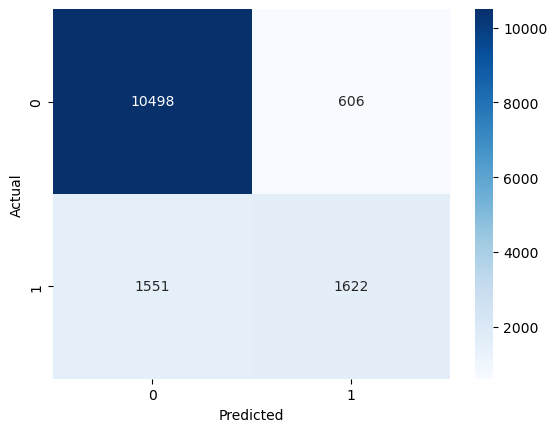

In [148]:
# Prediksi menggunakan model Decision Tree Classifier
predictions = model.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=model.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=model.classes_, yticklabels=model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

- Model KNN menunjukkan kinerja yang baik dengan 10,301 prediksi benar negatif (True Negative) dan 1,625 prediksi benar positif (True Positive) dengan akurasi paling tinggi diantara model lainnya yaitu 85%
- Terdapat 579 prediksi false positif (False Positive), menandakan adanya ketidakakuratan dalam mengidentifikasi kelas positif.
- Sebaliknya, 1,535 prediksi false negatif (False Negative) menunjukkan potensi untuk meningkatkan akurasi pada kelas positif.
- Evaluasi model ini menunjukkan kebutuhan untuk fokus pada peningkatan akurasi pada kelas positif guna mengurangi jumlah false negatives.


## Membuat DataFrame untuk hasil prediksi

In [149]:
# Membuat DataFrame untuk hasil prediksi
result_df = pd.DataFrame(data=X_test.copy())
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

# Menampilkan hasil DataFrame
result_df

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,Actual,Predicted
0,12.0,3.4,15.7,0.2,1.8,5.5,0.0,24.000000,2.0,2.0,...,1023.4,4.27875,4.349326,6.6,0.0,6.0,1.0,15.1,0,0
1,18.0,8.4,16.5,1.6,4.0,10.1,3.0,59.000000,7.0,3.0,...,1009.2,1.00000,6.000000,10.7,1.0,8.0,1.0,16.1,0,0
2,3.0,19.3,32.5,0.2,3.2,11.2,4.0,37.000000,1.0,0.0,...,1006.4,7.00000,7.000000,26.1,0.0,3.0,2.0,31.7,0,0
3,1.0,13.2,22.5,0.0,4.2,10.3,16.0,40.649909,15.0,12.0,...,1015.0,4.00000,6.000000,19.3,0.0,11.0,2.0,19.2,0,0
4,1.0,16.8,23.1,0.0,7.2,11.3,16.0,40.649909,10.0,2.0,...,1009.4,3.00000,4.000000,21.8,0.0,12.0,1.0,21.2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14272,32.0,9.0,19.2,3.0,2.2,7.8,12.0,28.000000,12.0,4.0,...,1020.6,5.00000,7.000000,13.3,1.0,7.0,3.0,17.8,1,0
14273,15.0,8.8,14.7,14.4,0.8,2.9,11.0,35.000000,9.0,11.0,...,1008.6,7.00000,7.000000,11.5,1.0,11.0,0.0,12.6,0,1
14274,42.0,21.8,39.6,0.0,12.0,12.2,5.0,35.000000,5.0,4.0,...,1014.7,4.00000,7.000000,28.2,0.0,12.0,3.0,37.5,0,0
14275,3.0,20.2,32.1,0.0,15.6,11.3,15.0,63.000000,15.0,13.0,...,1009.1,0.00000,0.000000,27.1,0.0,9.0,1.0,31.4,0,0


In [150]:
result_df['Predicted'].value_counts()

Predicted
0    12049
1     2228
Name: count, dtype: int64

In [151]:
error = []

In [152]:
for i in range(1,15):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred = knn.predict(X_test)
    error.append(np.mean(pred != y_test))

Text(0, 0.5, 'Error mean')

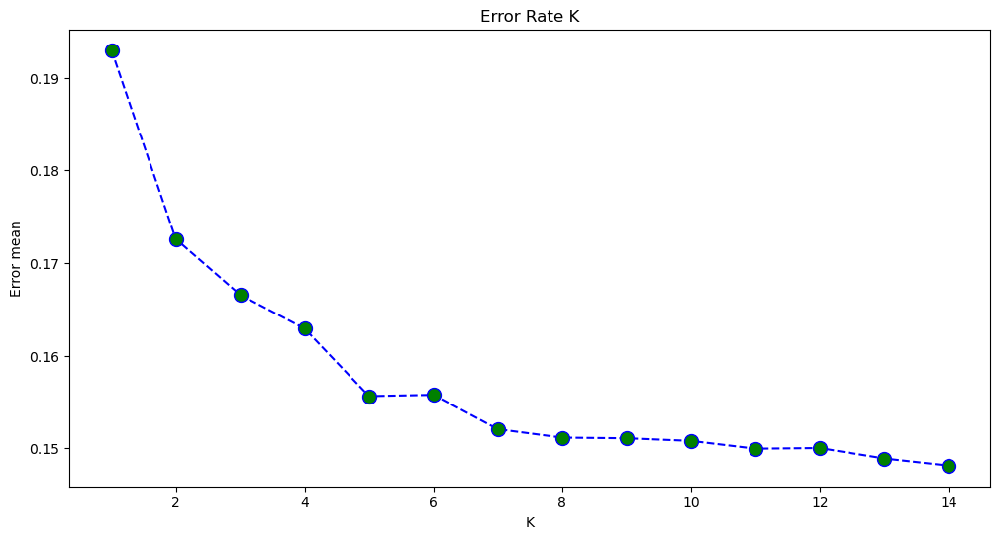

In [153]:
plt.figure(figsize=(12,6))
plt.plot(range(1,15), error, color='blue', linestyle='dashed', marker='o', markerfacecolor='green', markersize=10)
plt.title('Error Rate K')
plt.xlabel('K')
plt.ylabel('Error mean')

## Conclusion KNN 
- **Akurasi (Accuracy):** Model KNN mencapai tingkat akurasi sebesar 0.85, menunjukkan kemampuan model dalam mengklasifikasikan data dengan benar.

- **Precision, Recall, dan F1-Score:**
  - Untuk kelas 0 (Label 0), model memiliki precision sebesar 0.87, recall sebesar 0.95, dan f1-score sebesar 0.91. Hal ini menandakan kemampuan model dalam mengidentifikasi kelas 0 dengan tingkat keakuratan yang tinggi.
  
  - Untuk kelas 1 (Label 1), precision sebesar 0.74, recall sebesar 0.51, dan f1-score sebesar 0.61. Meskipun model cenderung dapat mengklasifikasikan kelas 1 dengan baik (precision), namun recall dan f1-score menunjukkan adanya tantangan dalam mengidentifikasi secara menyeluruh data yang sebenarnya termasuk ke dalam kelas ini.

- **Support:** Data dukungan (support) untuk kelas 0 sebanyak 10,880 dan kelas 1 sebanyak 3,160. Ini menunjukkan distribusi kelas pada data pengujian.

- **Macro dan Weighted Average:**
  - Rata-rata (macro avg) dari precision, recall, dan f1-score adalah 0.80, 0.73, dan 0.76 secara berturut-turut. Ini memberikan gambaran umum tentang kinerja model secara keseluruhan.
  
  - Rata-rata terimbang berdasarkan bobot (weighted avg) dari precision, recall, dan f1-score adalah 0.84, 0.85, dan 0.84 secara berturut-turut. Ini memberikan gambaran kinerja model dengan mempertimbangkan distribusi kelas.


- **Kesimpulan:** Dalam perbandingan dengan model lainnya, model KNN menonjol sebagai model dengan akurasi tertinggi ke 2 setelah random forrest, mencapai tingkat akurasi sekitar 85%. Keunggulan ini dapat memberikan kepercayaan tambahan terhadap kemampuan model dalam mengklasifikasikan data dengan tepat. Namun, walaupun memiliki akurasi yang tinggi, perlu diperhatikan bahwa model ini masih memiliki tantangan dalam mengidentifikasi data pada kelas minoritas, terutama kelas 1, yang ditunjukkan oleh recall yang relatif rendah. Oleh karena itu, untuk pengembangan lebih lanjut, fokus pada peningkatan recall pada kelas 1 dapat menjadi langkah strategis untuk memperbaiki keseimbangan kinerja model ini.



# Naive Bayes

### Spliting Data menjadi 80% untuk training dan 20% untuk testing

In [154]:
X = df_model[feature_cols].values
y = df_model[target_col].values
split_test_size = 0.20

In [155]:
y = y.ravel()

## Train Model

In [156]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=split_test_size, random_state=45)

In [157]:
Model = GaussianNB()
Model = Model.fit(X_train, y_train)
y_pred = Model.predict(X_test)

## Evaluasi model

In [158]:
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy:  0.7984870771170414
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.84      0.87     11052
           1       0.54      0.66      0.60      3225

    accuracy                           0.80     14277
   macro avg       0.72      0.75      0.73     14277
weighted avg       0.82      0.80      0.80     14277



## Confusion Matrix

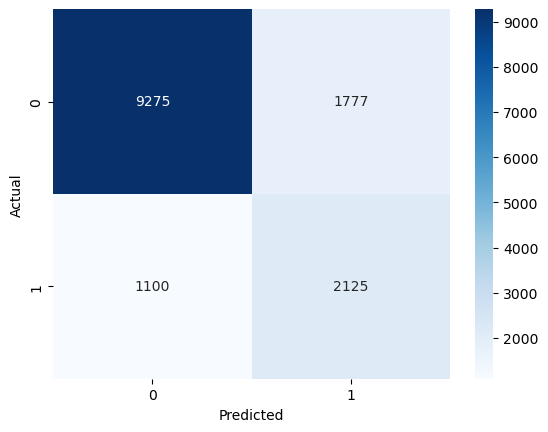

In [159]:
# Prediksi menggunakan Model Decision Tree Classifier
predictions = Model.predict(X_test)

# Menghitung confusion matrix
cm = confusion_matrix(y_test, predictions, labels=Model.classes_)

# Menampilkan confusion matrix dengan format angka tanpa eksponensial menggunakan heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=Model.classes_, yticklabels=Model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [160]:
# Membuat DataFrame untuk hasil prediksi
result_df = pd.DataFrame(data=X_test.copy())
result_df['Actual'] = y_test
result_df['Predicted'] = y_pred

# Menampilkan hasil DataFrame
result_df

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,Actual,Predicted
0,38.0,9.700000,17.300000,0.800000,1.0,6.6,8.0,39.000000,8.0,7.0,...,1032.700000,3.00000,3.000000,14.30000,0.0,5.0,2.0,16.90000,0,0
1,37.0,18.600000,26.100000,0.000000,7.6,11.3,16.0,40.649909,0.0,1.0,...,1021.400000,0.00000,0.000000,21.90000,0.0,3.0,1.0,26.00000,0,0
2,7.0,13.100000,25.700000,0.000000,4.0,8.2,14.0,31.000000,7.0,8.0,...,1018.200000,1.00000,7.000000,22.10000,0.0,9.0,1.0,16.20000,1,0
3,7.0,10.000000,22.800000,0.000000,4.8,10.0,10.0,20.000000,0.0,12.0,...,1022.400000,2.00000,2.000000,15.60000,0.0,8.0,2.0,20.50000,0,0
4,15.0,12.800000,17.800000,0.000000,4.2,6.2,3.0,41.000000,11.0,11.0,...,1008.800000,8.00000,7.000000,13.20000,0.0,12.0,0.0,17.00000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14272,35.0,10.400000,24.900000,0.000000,6.0,13.1,2.0,41.000000,2.0,6.0,...,1021.900000,4.00000,1.000000,17.80000,0.0,1.0,0.0,23.10000,0,0
14273,19.0,14.000000,25.100000,0.000000,6.8,7.7,9.0,35.000000,8.0,10.0,...,1019.600000,7.00000,6.000000,18.00000,0.0,2.0,0.0,23.70000,0,0
14274,37.0,8.500000,14.100000,1.200000,2.2,0.0,13.0,33.000000,11.0,13.0,...,1027.600000,7.00000,7.000000,9.10000,1.0,6.0,6.0,13.70000,1,1
14275,13.0,17.500000,31.700000,0.000000,7.4,10.2,0.0,37.000000,6.0,2.0,...,1012.500000,3.00000,2.000000,23.70000,0.0,8.0,4.0,28.50000,0,0


In [161]:
result_df['Actual'] = y_test

In [162]:
result_df['Predicted'].value_counts()

Predicted
0    10375
1     3902
Name: count, dtype: int64

In [163]:
result_true = result_df[result_df['Predicted'] == 0]

In [164]:
result_true.head(20)

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,Actual,Predicted
0,38.0,9.7,17.3,0.8,1.0,6.6,8.0,39.000000,8.0,7.0,...,1032.7,3.00000,3.000000,14.3,0.0,5.0,2.0,16.9,0,0
1,37.0,18.6,26.1,0.0,7.6,11.3,16.0,40.649909,0.0,1.0,...,1021.4,0.00000,0.000000,21.9,0.0,3.0,1.0,26.0,0,0
2,7.0,13.1,25.7,0.0,4.0,8.2,14.0,31.000000,7.0,8.0,...,1018.2,1.00000,7.000000,22.1,0.0,9.0,1.0,16.2,1,0
3,7.0,10.0,22.8,0.0,4.8,10.0,10.0,20.000000,0.0,12.0,...,1022.4,2.00000,2.000000,15.6,0.0,8.0,2.0,20.5,0,0
4,15.0,12.8,17.8,0.0,4.2,6.2,3.0,41.000000,11.0,11.0,...,1008.8,8.00000,7.000000,13.2,0.0,12.0,0.0,17.0,0,0
5,48.0,9.2,17.0,6.6,6.6,8.8,8.0,48.000000,8.0,1.0,...,1019.8,3.00000,1.000000,12.4,1.0,9.0,3.0,15.7,0,0
6,31.0,14.2,22.3,0.0,4.0,9.6,11.0,37.000000,8.0,9.0,...,1016.7,2.00000,1.000000,17.3,0.0,5.0,4.0,21.9,0,0
8,48.0,12.7,28.4,1.6,10.6,13.1,10.0,50.000000,11.0,9.0,...,1019.4,1.00000,0.000000,16.6,1.0,12.0,4.0,25.8,0,0
9,22.0,11.6,23.0,0.0,6.0,10.4,8.0,52.000000,8.0,10.0,...,1013.0,7.00000,3.000000,17.2,0.0,1.0,0.0,22.1,0,0
11,3.0,2.3,21.3,0.0,4.4,11.1,0.0,35.000000,4.0,4.0,...,1017.3,0.00000,0.000000,12.9,0.0,8.0,0.0,20.6,0,0


In [165]:
result_true.tail(20)

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,Actual,Predicted
14248,38.0,15.200000,21.700000,6.200000,2.8,12.2,8.0,65.0,8.0,11.0,...,1010.900000,3.00000,3.000000,18.20000,1.0,1.0,3.0,21.00000,0,0
14253,44.0,8.500000,17.300000,0.000000,4.0,6.6,15.0,46.0,15.0,7.0,...,1019.800000,7.00000,7.000000,11.40000,0.0,10.0,0.0,16.70000,0,0
14254,38.0,11.300000,18.100000,1.000000,8.4,10.4,13.0,48.0,9.0,13.0,...,1017.700000,2.00000,3.000000,15.20000,0.0,9.0,2.0,17.00000,0,0
14255,39.0,23.200000,29.800000,0.000000,10.4,11.2,4.0,39.0,1.0,4.0,...,1015.400000,5.00000,1.000000,26.40000,0.0,10.0,2.0,27.90000,0,0
14256,7.0,13.800000,26.200000,0.000000,3.8,11.0,0.0,24.0,1.0,12.0,...,1019.700000,1.00000,1.000000,21.20000,0.0,9.0,2.0,24.30000,0,0
14257,21.0,16.200000,28.900000,0.000000,9.4,11.0,12.0,50.0,12.0,12.0,...,1008.800000,3.00000,1.000000,19.20000,0.0,3.0,0.0,28.00000,0,0
14258,28.0,11.900000,32.200000,0.000000,8.0,10.0,7.0,33.0,3.0,4.0,...,1011.700000,0.00000,3.000000,16.20000,0.0,3.0,4.0,29.60000,0,0
14259,39.0,24.500000,31.500000,0.200000,10.0,11.6,0.0,46.0,0.0,9.0,...,1004.500000,3.00000,1.000000,28.90000,0.0,1.0,4.0,30.80000,0,0
14260,10.0,23.100000,33.300000,0.000000,10.0,4.5,0.0,54.0,0.0,2.0,...,1007.100000,7.00000,5.000000,23.60000,0.0,2.0,1.0,31.30000,0,0
14262,32.0,7.900000,17.300000,4.000000,1.0,5.7,11.0,39.0,8.0,3.0,...,1020.400000,7.00000,2.000000,10.70000,1.0,6.0,5.0,16.60000,1,0


# Overall Analysis

## Logistic Regression vs SVM

## 1. Logistic Regression
### Classification Report Logistic Regression

Model Regresi Logistik berhasil mencapai akurasi sebesar 85,14% pada dataset uji. Berikut adalah laporan klasifikasi secara rinci:

|    | Presisi | Recall | F1-Score | Dukungan |
|----|---------|--------|----------|----------|
| 0  | 0,87    | 0,95   | 0,91     | 11104    |
| 1  | 0,74    | 0,52   | 0,61     | 3173     |

- **Akurasi:** 85,14%
- **Presisi Rata-rata (Macro):** 0,80
- **Recall Rata-rata (Macro):** 0,73
- **F1-Score Rata-rata (Macro):** 0,76
- **Presisi Rata-rata (Weighted):** 0,84
- **Recall Rata-rata (Weighted):** 0,85
- **F1-Score Rata-rata (Weighted):** 0,84

### Confusion Matrix:

|               | Kelas 0 Diprediksi | Kelas 1 Diprediksi |
|---------------|---------------------|---------------------|
| Aktual Kelas 0| 10513               | 591                 |
| Aktual Kelas 1| 1531                | 1642                |

Pada matriks kebingungan:
- Elemen diagonal mewakili jumlah prediksi yang benar.
- Elemen di luar diagonal adalah klasifikasi yang salah, di mana baris mewakili kelas aktual, dan kolom mewakili kelas yang diprediksi.

Metrik-metrik ini memberikan wawasan tentang kinerja model untuk setiap kelas dan secara keseluruhan. Dikarekan jumlah false positif masih banyakm, maka akan dilakukan optimasi terhadap kinerja Logistic Regression

## 2. SVM
### Classification Report Support Vector Machine (SVM)

Model Support Vector Machine (SVM) berhasil mencapai akurasi sebesar 84% pada dataset uji. Berikut adalah laporan klasifikasi secara rinci:

|    | Presisi | Recall | F1-Score | Dukungan |
|----|---------|--------|----------|----------|
| 0  | 0,84    | 0,98   | 0,90     | 11104    |
| 1  | 0,82    | 0,36   | 0,50     | 3173     |

- **Akurasi:** 84%
- **Presisi Rata-rata (Macro):** 0,83
- **Recall Rata-rata (Macro):** 0,67
- **F1-Score Rata-rata (Macro):** 0,70
- **Presisi Rata-rata (Weighted):** 0,84
- **Recall Rata-rata (Weighted):** 0,84
- **F1-Score Rata-rata (Weighted):** 0,82

Meskipun model SVM menunjukkan akurasi yang baik, terdapat ketidakseimbangan antara kelas 0 dan kelas 1, terutama dalam hal recall untuk kelas 1. Peningkatan kinerja model, terutama dalam mendeteksi data kelas 1, mungkin dapat dicapai melalui penyesuaian model atau pemilihan fitur yang lebih baik. Evaluasi lebih lanjut diperlukan untuk memahami aspek-aspek tertentu yang memengaruhi performa model SVM ini.
### Confusion Matrix SVM:

|                   | Prediksi Kelas 0 | Prediksi Kelas 1 |
|-------------------|------------------|------------------|
| Aktual Kelas 0    | 10846            | 258              |
| Aktual Kelas 1    | 2025             | 1148             |
- Elemen diagonal mewakili jumlah prediksi yang benar.
- Elemen di luar diagonal adalah klasifikasi yang salah, di mana baris mewakili kelas aktual, dan kolom mewakili kelas yang diprediksi.

Confusion matrix memberikan pandangan detail tentang kinerja model pada setiap kelas dan dapat membantu dalam menilai sejauh mana model dapat mengklasifikasikan dengan benar setiap kelas.


## Conclusion
1. Dataset ini memiliki jumlah null value yang cukup banyak, sehingga memerlukan analisis lebih lanjut untuk menangani null values, sebagian rows dari kolom yang memiliki null values paling banyak adalah Evaporation, Sunshine, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm. Sehingga dilakukan dropna atau penghapusan nilai null. dan kolom lainnya diisi dengan KNN imputer.
2. Curah hujan paling tinggi adalah tahun 2016.
3. Wilayah dengan tingkat curah hujan tertinggi adalah Portland
4. Korelasi antara MaxTemp dan Temp3pm hampir bernilai 1. Dikarenakan MaxTemp mungkin terjadi sekitar pukul 3 sore.
5. Terdapat outlier pada kolom numerik Rainfall, Evaporation dan kolom lainnya. Dengan demikian, kita dapat menyesuaikan parameter agar kinerja model tetap maximal.
6. Diantara **Logistic Regression** dan **SVM**. Model yang paling baik dalam hal accuracy 85% dan recall adalah Logistic Regression. 
7. Dari semua model yang telah dilakukan training, testing, dan evaluasi. Model yang paling baik kinerja nya adalah Random Forrest Classifier. Dikarenakan memiliki akurasi yang paling tinggi yaitu 86%, dan recall yang cukup untuk mengidentifikasi 1, dan 2, FN dan FP yang sedikit, dan TP dn TN yang paling tinggi.
8. Important features yang paling berpengaruh terhadap kinerja Random Forrest Classifier adalah Humidity3pm. Atau kelembapan cuaca pada pukul 3pm. 